In [1]:
import numpy as np
import scanpy as sc
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt

sc.settings.verbosity = 3  

import warnings
warnings.filterwarnings('ignore')
cmap = mcolors.LinearSegmentedColormap.from_list('WhRd',["#e5e5e5", "#fffacd", "red", "darkred"], N=256)  

In [4]:
pt_ad = sc.read_h5ad("pt_ad_BBKNN.h5ad")

In [5]:
pt_ad.uns['celltype_bbknn_colors'] = ["#d3d3d3", "#B0CF98", "#426D54", "#f2c85b", "#fba465", "#f86e51", "#6c146c"]

In [10]:
color_dict = dict(zip(pt_ad.obs["celltype_bbknn"].cat.categories, pt_ad.uns['celltype_bbknn_colors']))

Figure 3A

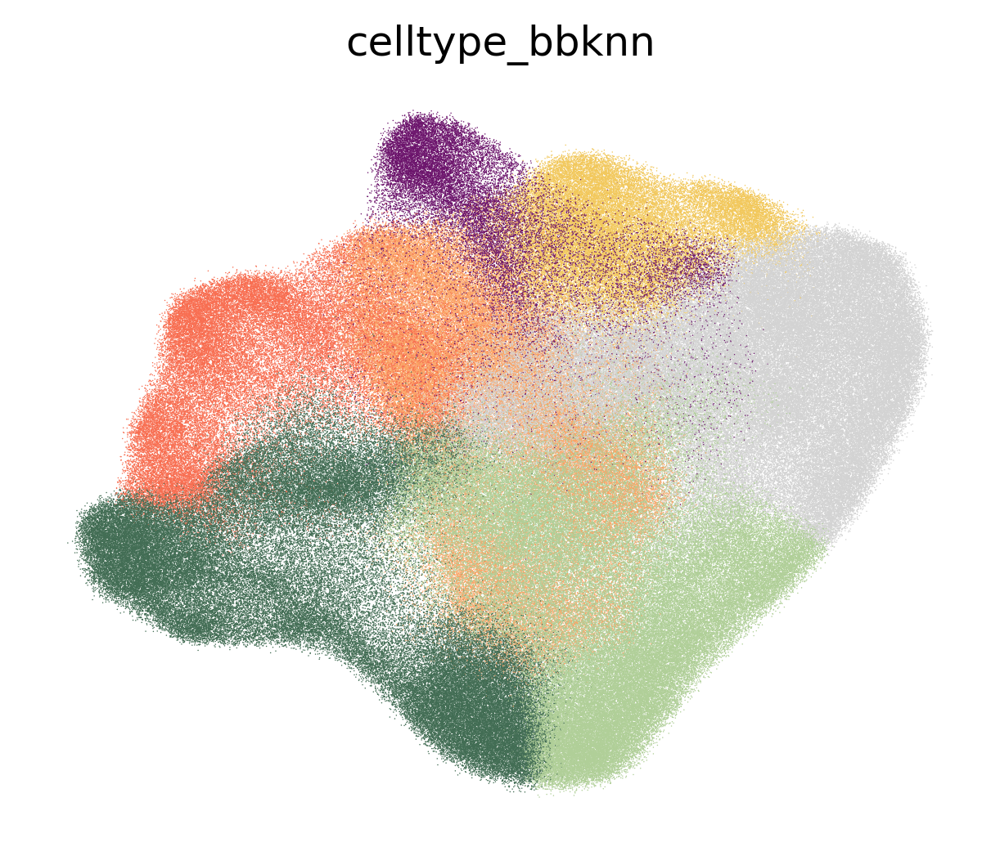

In [10]:
with plt.rc_context({"figure.dpi": (300), "figure.figsize":(5,4), "savefig.dpi":(300)}):
    ax = sc.pl.umap(pt_ad, color=["celltype_bbknn"], 
               legend_fontsize=6, legend_loc = None, frameon=False, size=0.5, show=False)
    plt.savefig("PT_UMAP.png", transparent=True, bbox_inches="tight")
    plt.show()

In [8]:
celltype_color_dict = dict(zip(list(pt_ad.obs["celltype_bbknn"].cat.categories), pt_ad.uns['celltype_bbknn_colors']))

ct_df = pd.DataFrame()
conditions = ["Sham", "Hour4", "Hour12", "Day2", "Day14", "Week6"]
pt_ad.obs["time"] = pt_ad.obs["ident"].str[:-1]
for t in conditions:
    df = pd.DataFrame(pt_ad[pt_ad.obs.time==t].obs["celltype_bbknn"].value_counts())
    df.columns=[t]
    ct_df = pd.concat([ct_df,df], axis=1)
    
legend_order = ["Healthy_S1", "Healthy_S2", "Healthy_S3", 'Inj_S1','Inj_S2','Inj_S3','Failed_repair']
ct_df = ct_df.loc[legend_order,]
colors = list(celltype_color_dict[i] for i in ct_df.index)
normed_df = ct_df.copy()
for col in normed_df.columns:  
    normed_df[col] = normed_df[col].div(normed_df[col].sum())

In [15]:
from matplotlib.collections import PolyCollection
from matplotlib.legend_handler import HandlerPatch

from matplotlib.colors import to_rgba
import matplotlib.patches as mpatches
import matplotlib.cm as cm

class HandlerSquare(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = 0.5 * width - 0.5 * xdescent, 0
        p = mpatches.Rectangle(xy=center, width=height,
                               height=height, angle=0.0)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]
        
def connected_barplot(dat, color=None, outline_color='black', space=1, c_alpha=0.4, b_alpha=1, outline_alpha=1.0, celltype_color_dict=None):
    if color is None:
        color = plt.cm.viridis(np.linspace(0, 1, dat.shape[0]))
        
    bar_color = [to_rgba(c, b_alpha) for c in color]
    poly_color = [to_rgba(c, c_alpha) for c in color]
    
    outline_color = to_rgba(outline_color, outline_alpha)
    
    fig, ax = plt.subplots(figsize=(6,3.5), dpi=300)
    x = np.arange(dat.shape[1]) * (space+1)
    cum_dat = np.cumsum(dat, axis=0)
    
    for i in range(dat.shape[0]):
        if i == 0:
            ax.bar(x, dat.iloc[i, :], color=bar_color[i], width=1, align='edge', edgecolor=outline_color, linewidth=0.5)
        else:
            ax.bar(x, dat.iloc[i, :], bottom=cum_dat.iloc[i-1, :], color=bar_color[i], width=1, align='edge', edgecolor=outline_color, linewidth=0.5)

    polygon_dat = []
    for i in range(dat.shape[1]-1):
        for j in range(dat.shape[0]):
            if j == 0:
                polygon_dat.append([(x[i]+1,0), (x[i]+1,dat.iloc[j,i]), (x[i+1],dat.iloc[j,i+1]), (x[i+1],0)])
            else:
                polygon_dat.append([(x[i]+1,cum_dat.iloc[j-1,i]), (x[i]+1,cum_dat.iloc[j,i]), 
                              (x[i+1],cum_dat.iloc[j,i+1]), (x[i+1],cum_dat.iloc[j-1,i+1])])
                
    poly = PolyCollection(polygon_dat, facecolors=poly_color, edgecolors=outline_color, linewidth=0.5, alpha=0.5)
    ax.add_collection(poly)
    ax.autoscale_view()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    #ax.spines['bottom'].set_visible(False)
    ax.set_xticks([])
    ax.set_ylim([0,1])
    #ax.set_xticklabels(["", "Sham","Hour4","Hour12","Day2","Day14","Week6"], rotation=0, fontsize=15)
    
    handles = [Patch(facecolor=color, label=label) for label, color in celltype_color_dict.items()]
    ax.legend(handles=handles, bbox_to_anchor=(0.95, 1), loc='upper left', 
              ncol=1, frameon=False, handler_map={mpatches.Patch: HandlerSquare()}, fontsize=12)

    plt.tight_layout()
    plt.savefig("connected_bar_PT.png", transparent=True, bbox_inches='tight')
    plt.show()

In [13]:
normed_df

,Sham,Hour4,Hour12,Day2,Day14,Week6
celltype_bbknn,,,,,,
Healthy_S1,0.262273,0.210483,0.047727,0.421851,0.264113,0.247789
Healthy_S2,0.352627,0.186480,0.064292,0.048423,0.250894,0.378942
Healthy_S3,0.379464,0.124597,0.019647,0.008008,0.226990,0.344765
Inj_S1,0.000302,0.097175,0.340446,0.023522,0.001098,0.000391
Inj_S2,0.000835,0.168887,0.277066,0.394581,0.012515,0.002916
Inj_S3,0.002389,0.207927,0.247259,0.068863,0.017668,0.005092
Failed_repair,0.002111,0.004451,0.003562,0.034751,0.226722,0.020105


Figure 3B

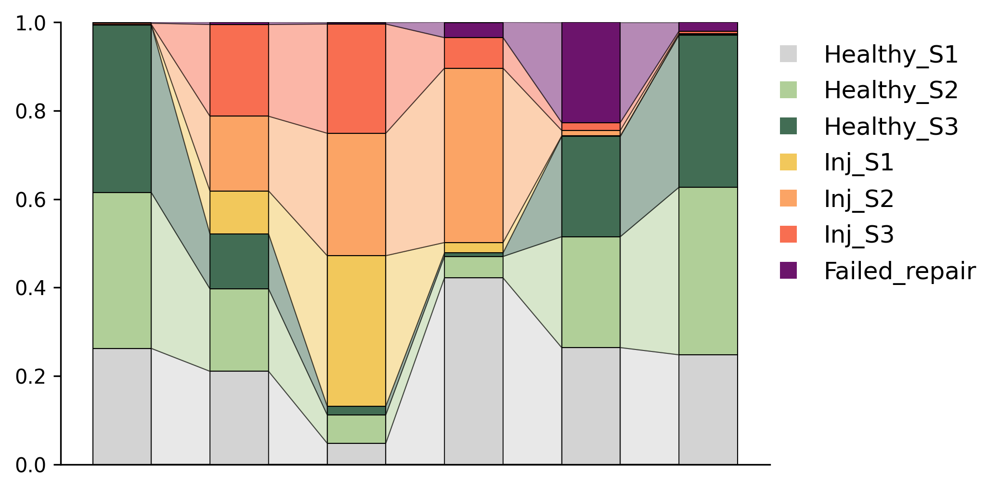

In [14]:
connected_barplot(normed_df, color=pt_ad.uns['celltype_bbknn_colors'], outline_color='black', outline_alpha=1, celltype_color_dict=celltype_color_dict)


Figure 3C

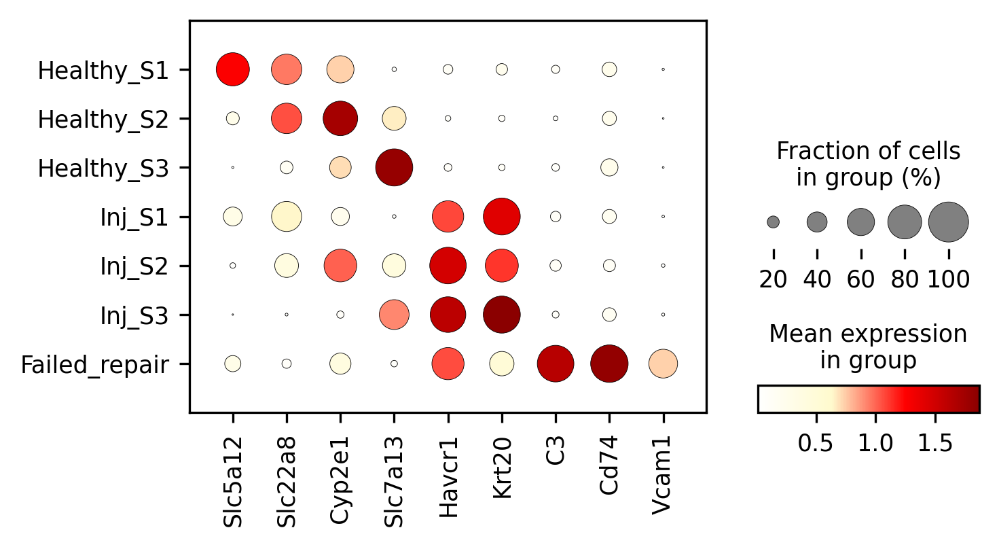

In [8]:
genes = ['Slc5a12','Slc22a8', 'Cyp2e1','Slc7a13','Havcr1', 'Krt20', "C3", 'Cd74', 'Vcam1']
cmap = mcolors.LinearSegmentedColormap.from_list('WhRd',['#ffffff', "#fffacd", "red", "darkred"], N=256)  
with plt.rc_context({"figure.dpi": (300)}):
    sc.pl.dotplot(pt_ad, genes, 'celltype_bbknn', cmap = cmap, figsize=(5,2.5), show=False)
    #ax.legend(loc='best', ncol=1)
    plt.savefig("PT_dotplot.png", transparent=True, bbox_inches="tight")

Supplementary Figure 5A

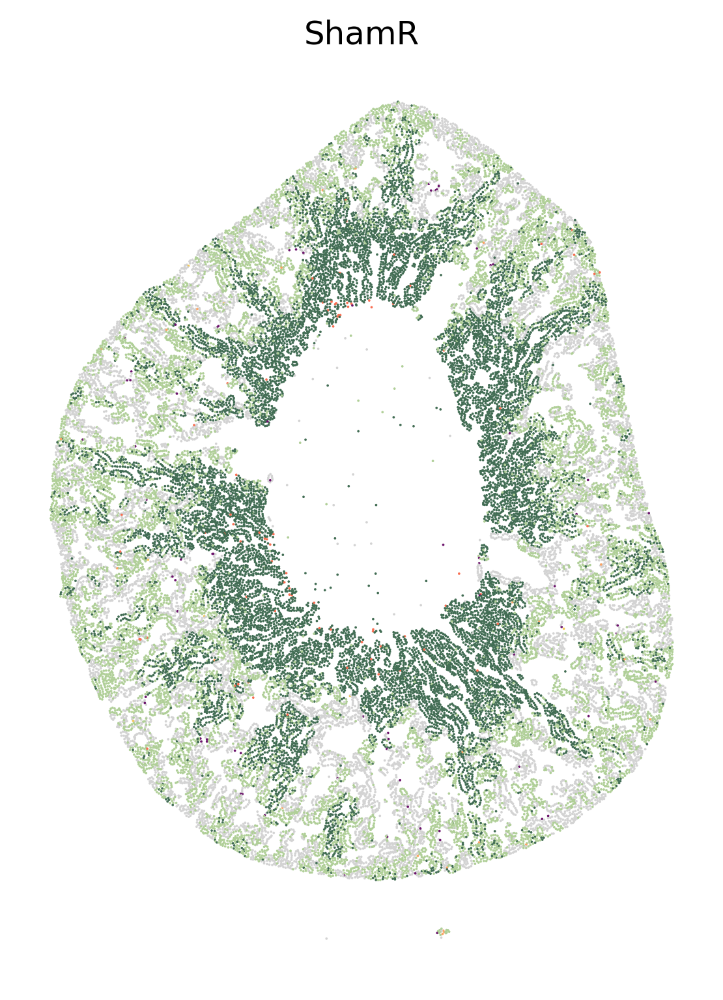

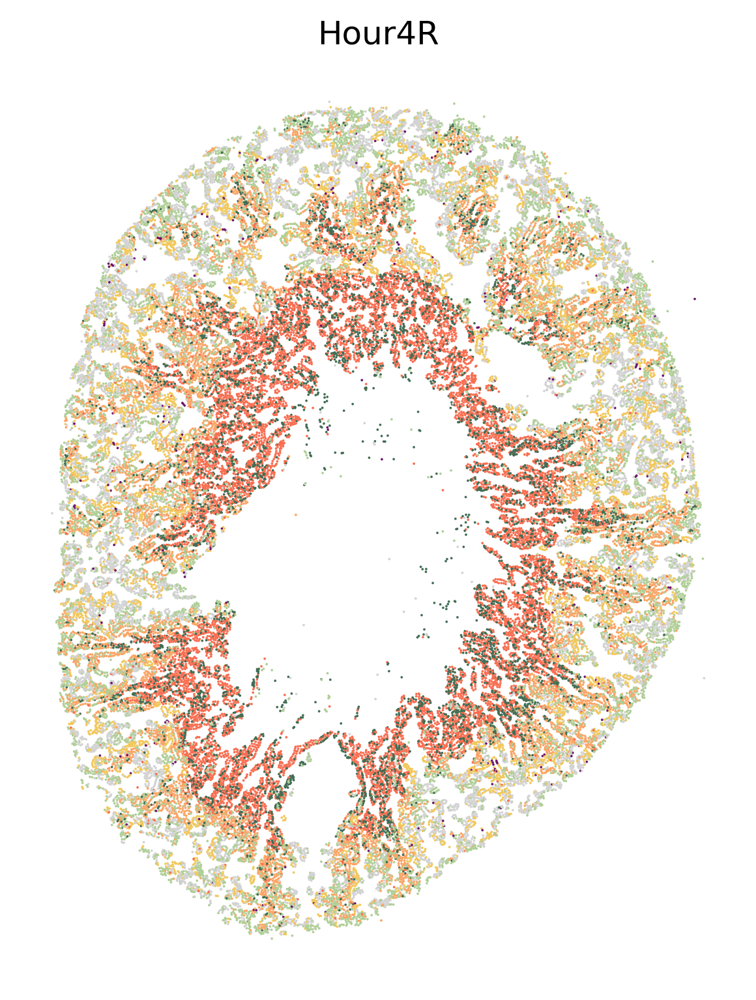

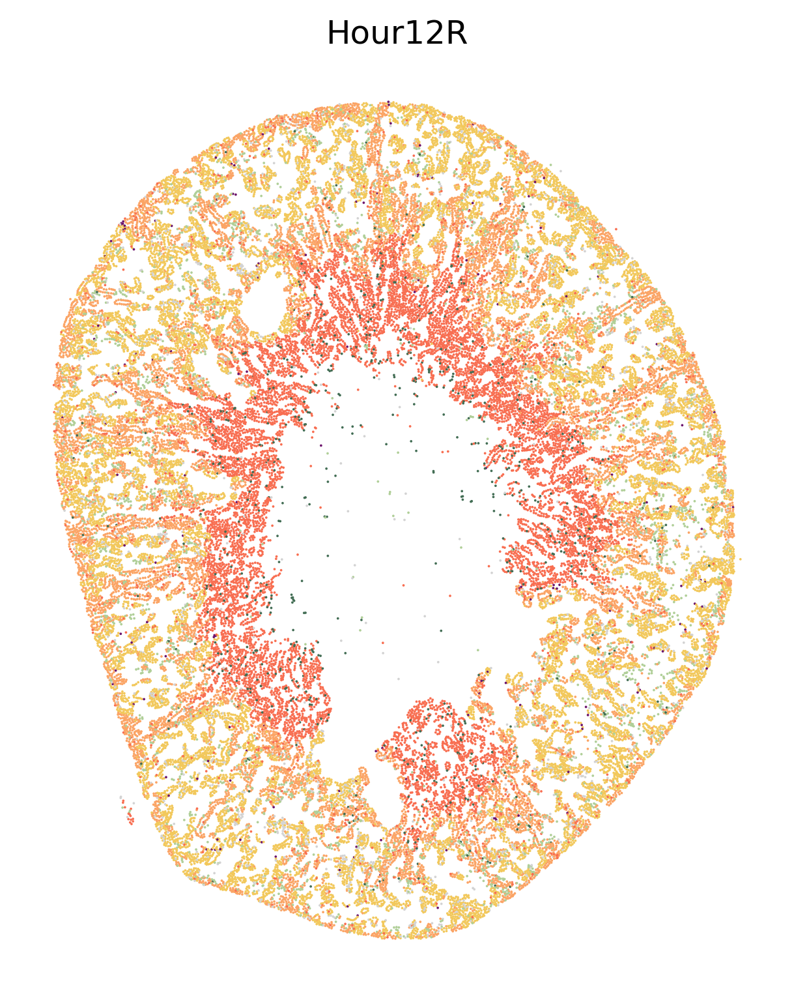

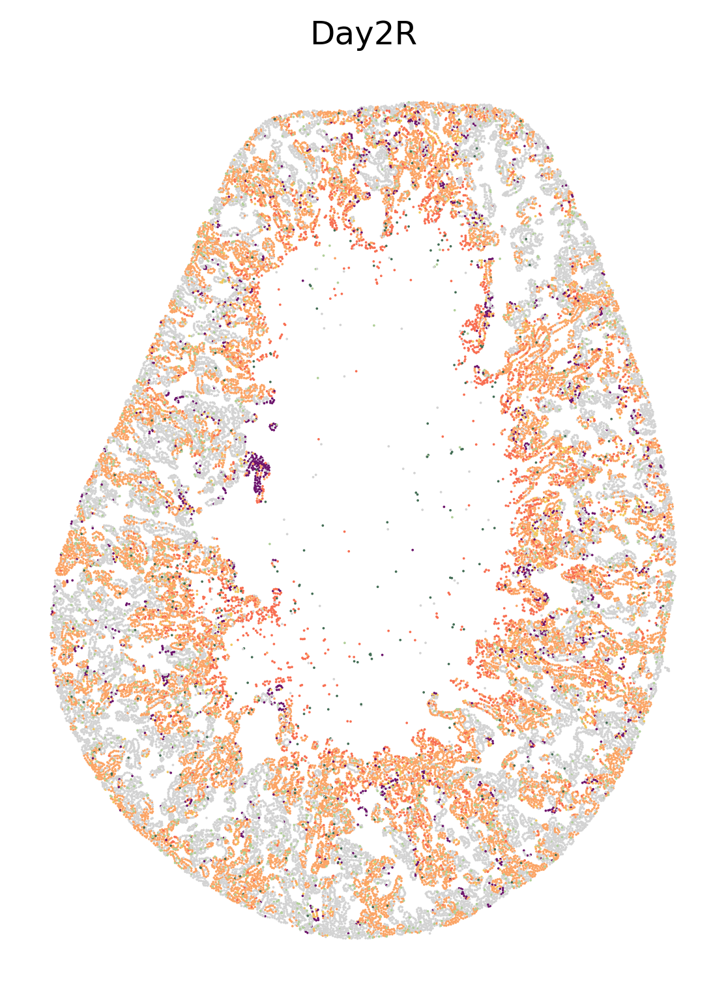

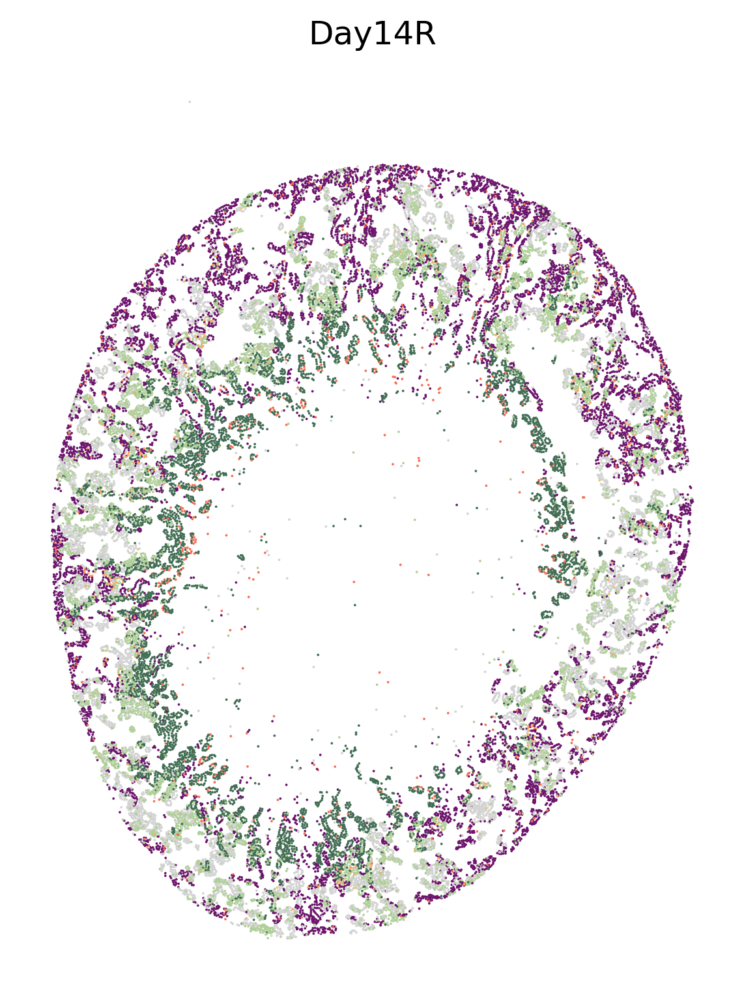

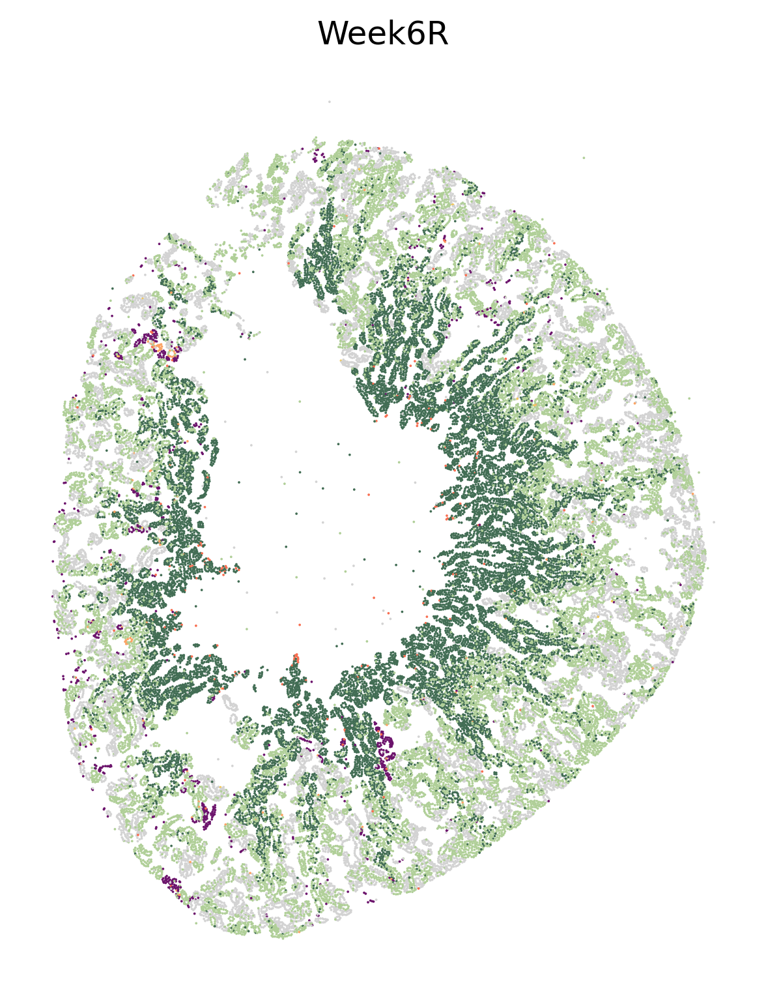

In [10]:
time_groups = ["ShamR","Hour4R","Hour12R","Day2R","Day14R","Week6R"]

for index, t in enumerate(time_groups):
    
    plot_settings = {
        'color_by': "celltype_bbknn",
        'alpha': 1,
        'dpi': 300,
        'ptsize': 0.8,  
        'legend_col': 1,
        'ticks': False,
        'save': f"{t}_PT_spatial.jpg" 
    }

    pst.plot_scatter(pt_ad[pt_ad.obs.ident == t], **plot_settings)